# Lab 5: Deep learning based end-to-end speech recognition 

The goal of this assignment is to get familiar with applications that require speech data as input.

We would be using the torchaudio library (pip install torchaudio==0.11.0), please carefull read this tutorial https://pytorch.org/tutorials/intermediate/speech_recognition_pipeline_tutorial.html

Next, we would ask you to perform similar analysis on a speech dataset, i.e., speechdata.zip. Unzip this folder, you would see a folder named wavs, and a file called "labels.csv", containing annotated transcripts, including the files in the wavs folder (you have more labels in labels.csv). This dataset is selected from https://keithito.com/LJ-Speech-Dataset/, a famous speech-based application benchmark.

General torchaudio tutorials: https://pytorch.org/tutorials/index.html

**Submission: submit via onq.** 


In [101]:
# Import needed libraries. 
import torch
import torchaudio


import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

# Math
import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
import librosa

from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(torch.__version__)
print(torchaudio.__version__)

1.11.0+cu113
0.11.0+cu113


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Task 1: Basic data exploration
Select one randomly sampled wav file in the given folder, perform the following analysis:

1) Print the shape of the picked waveform

2) Print the sample rate of the waveform. 

3) Visualize the waveform using matplotlib

4) Create the spectrogram representation of the picked waveform and visualize it. 

5) Create the MFCC representation of the picked waveform and visualize it.

Reference: https://www.kaggle.com/code/davids1992/speech-representation-and-data-exploration/notebook 

In [51]:
# TODO code for task 1
SPEECH_FILE= "/content/drive/MyDrive/wavs/LJ001-0008.wav"

waveform, sample_rate = torchaudio.load(SPEECH_FILE)


print("Shape of waveform: {}".format(waveform.size()))
print("Sample rate of waveform: {}".format(sample_rate))

Shape of waveform: torch.Size([1, 39325])
Sample rate of waveform: 22050


In [ ]:
import IPython.display as ipd
ipd.Audio(SPEECH_FILE)

In [52]:
def log_specgram(audio, sample_rate, window_size=20,
                 step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                    fs=sample_rate,
                                    window='hann',
                                    nperseg=nperseg,
                                    noverlap=noverlap,
                                    detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

In [68]:
min(np.linspace(0, sample_rate/len(waveform), sample_rate))

0.0

In [70]:
samples, sample_rate = librosa.load(str(train_audio_path)+filename)

Text(0.5, 0, 'Seconds')

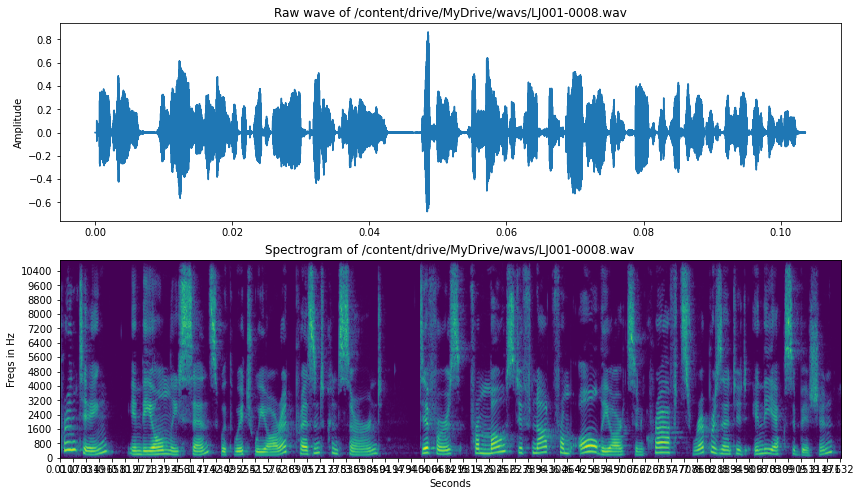

In [73]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig = plt.figure(figsize=(14, 8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + SPEECH_FILE)
ax1.set_ylabel('Amplitude')
ax1.plot(np.linspace(0, sample_rate/len(samples), len(samples)), samples)

ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of ' + SPEECH_FILE)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('Seconds')

In [74]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std

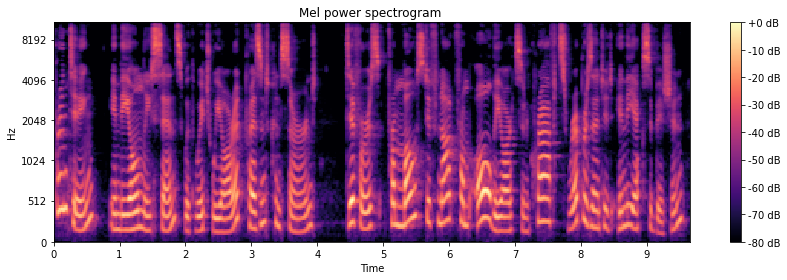

In [75]:
# From this tutorial
# https://github.com/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
S = librosa.feature.melspectrogram(samples, sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12, 4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel power spectrogram ')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

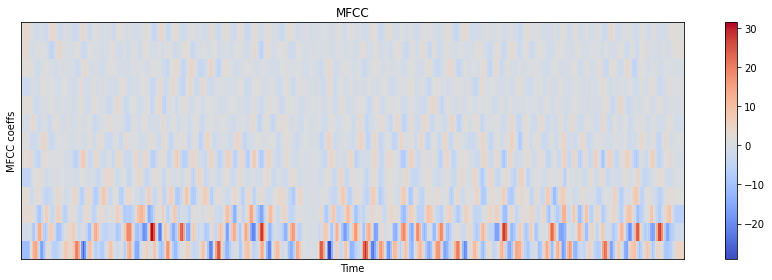

In [76]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12, 4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

In [78]:
data = [go.Surface(x=times, y=freqs, z=spectrogram.T)]
layout = go.Layout(
title='Specgtrogram of "yes" in 3d',
scene = dict(
yaxis = dict(title='Frequncy', range=[freqs.min(),freqs.max()]),
xaxis = dict(title='Time', range=[times.min(),times.max()],),
zaxis = dict(title='Log amplitude'),
),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

## Task 2: Creating a Wav2Vec2 model that can perform feature extraction and classification.


In [ ]:
SPEECH_FILE= "/content/drive/MyDrive/wavs/LJ001-0008.wav"

waveform, sample_rate = torchaudio.load(SPEECH_FILE)


In [80]:
# TODO code for task 2
# Build the model and load pretrained weights 
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H 
print("Sample Rate:", bundle.sample_rate)

model = bundle.get_model()
# print('\nModel Architecture')
# print(model)

labels = bundle.get_labels()
print('\nlabels: ', labels)

# Resample audio to the expected sampling rate
if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

# Wav2Vec2 model provides method to perform the feature extraction and classification in one step
# Infer the label probability distribution
emissions, _ = model(waveform) 

print('\nemissions ', emissions)

Sample Rate: 16000

labels:  ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')

emissions  tensor([[[ 12.8178,   0.6528,  -0.1014,  ...,  -9.7091, -11.9702,  -9.5909],
         [  7.8586,  -1.6810,  -0.6130,  ...,  -5.0620,  -9.7042,  -5.0397],
         [ 15.5066,   3.3702,   2.2090,  ...,  -8.9197, -12.5757,  -8.8040],
         ...,
         [ 16.5980,   0.1475,  -3.5521,  ...,  -9.4868, -10.9996, -10.2278],
         [ 14.3846,   0.2309,  -1.5265,  ...,  -8.5338,  -9.4928,  -8.8890],
         [ 16.4570,   0.1789,  -3.4199,  ...,  -9.5049, -11.0368, -10.1238]]],
       grad_fn=<AddBackward0>)


## Task 3: Extract acoustic features and generate predicted transcript for each waveform in the given dataset

In [81]:
# TODO code for task 3
# Generating transcripts
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]  
        print('Predict a sequence of tokens', indices)
        indices = torch.unique_consecutive(indices, dim=-1) 
        print('\nMerge repeats ', indices)
        # Final output after dropping blank (-)
        indices = [i for i in indices if i != self.blank]
        print('\nlabels', [self.labels[i] for i in indices]) 
        return "".join([self.labels[i] for i in indices])

In [94]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emissions[0])

print('\nTranscript:', transcript.replace("|", ' '))

Predict a sequence of tokens tensor([ 0,  8,  0,  4,  0,  9,  0,  1,  1,  1,  0,  0,  6,  6,  0,  0,  0,  2,
         0, 22,  0,  2,  2, 10,  1,  1,  1,  1, 21,  0,  2,  2,  0,  0,  2,  6,
         6,  0,  1,  1,  0,  9,  0,  0,  0, 13,  0, 10,  0,  0,  0,  0, 20,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  9,  9,  0,  0,  0,  0,  9,  0,
         0,  0,  0,  2, 11,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0])

Merge repeats  tensor([ 0,  8,  0,  4,  0,  9,  0,  1,  0,  6,  0,  2,  0, 22,  0,  2, 10,  1,
        21,  0,  2,  0,  2,  6,  0,  1,  0,  9,  0, 13,  0, 10,  0, 20,  0,  4,
         9,  0,  9,  0,  2, 11,  0,  1,  0])

labels ['H', 'A', 'S', '|', 'N', 'E', 'V', 'E', 'R', '|', 'B', 'E', 'E', 'N', '|', 'S', 'U', 'R', 'P', 'A', 'S', 'S', 'E', 'D', '|']

Transcript: HAS NEVER BEEN SURPASSED 


In [91]:
transcript

'HAS|NEVER|BEEN|SURPASSED|'

## Task 4: evaluate the performance of the trained model on the testing dataset using Word Error Rate (WER), Match Error Rate (MER)

Hint: consider this package, https://pypi.org/project/jiwer/

In [95]:
#Function
def audio2text(SPEECH_FILE):
  """
  The main task of the function is to make speech recognition

  input: audio link
  output: audio transcript
  """
  waveform, sample_rate = torchaudio.load(SPEECH_FILE)
  waveform = waveform.to(device)

  if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

  with torch.inference_mode():
    emission, _ = model(waveform)

  decoder = GreedyCTCDecoder(labels=bundle.get_labels())
  transcript = decoder(emission[0])
  
  print(transcript.replace('|'," "))
  return transcript.replace('|'," ")

In [104]:
urls = '/content/drive/MyDrive/wavs'
audio_list = os.listdir(urls)

#len of audio files (must be 100 files)
print("Length of audio files",len(audio_list))

del audio_list[-1]

Length of audio files 101


In [105]:
audio_list

['LJ001-0038.wav',
 'LJ001-0065.wav',
 'LJ001-0100.wav',
 'LJ001-0095.wav',
 'LJ001-0078.wav',
 'LJ001-0017.wav',
 'LJ001-0062.wav',
 'LJ001-0021.wav',
 'LJ001-0085.wav',
 'LJ001-0090.wav',
 'LJ001-0018.wav',
 'LJ001-0096.wav',
 'LJ001-0028.wav',
 'LJ001-0037.wav',
 'LJ001-0053.wav',
 'LJ001-0007.wav',
 'LJ001-0013.wav',
 'LJ001-0045.wav',
 'LJ001-0015.wav',
 'LJ001-0027.wav',
 'LJ001-0039.wav',
 'LJ001-0087.wav',
 'LJ001-0002.wav',
 'LJ001-0089.wav',
 'LJ001-0056.wav',
 'LJ001-0001.wav',
 'LJ001-0016.wav',
 'LJ001-0046.wav',
 'LJ001-0049.wav',
 'LJ001-0023.wav',
 'LJ001-0050.wav',
 'LJ001-0043.wav',
 'LJ001-0083.wav',
 'LJ001-0074.wav',
 'LJ001-0032.wav',
 'LJ001-0012.wav',
 'LJ001-0035.wav',
 'LJ001-0094.wav',
 'LJ001-0040.wav',
 'LJ001-0080.wav',
 'LJ001-0030.wav',
 'LJ001-0060.wav',
 'LJ001-0071.wav',
 'LJ001-0066.wav',
 'LJ001-0031.wav',
 'LJ001-0086.wav',
 'LJ001-0091.wav',
 'LJ001-0073.wav',
 'LJ001-0079.wav',
 'LJ001-0004.wav',
 'LJ001-0005.wav',
 'LJ001-0048.wav',
 'LJ001-0042

In [106]:
transcripts=[]
for audio in audio_list:
    aduio_link= os.path.join(urls, audio)
    transcripts.append(audio2text(aduio_link))

Predict a sequence of tokens tensor([15,  8,  0,  0,  0,  7,  0, 12, 12,  2,  2,  1,  1,  1,  7,  6,  6,  1,
         1,  0,  0, 17,  0,  0,  0,  5, 13, 13, 10, 10,  0,  0,  0,  3,  0,  2,
         0,  0,  0,  2,  6,  6,  0,  0,  0,  1,  1,  0,  0,  0,  9,  0,  0,  0,
         2,  0,  0, 22,  0,  2,  6,  6,  0,  0,  3,  3,  0,  0,  0,  0,  0, 19,
         0,  1,  1,  1,  0,  0,  4,  3,  0,  1,  1,  0,  0, 20, 20,  0,  0,  0,
         0,  0,  0,  4,  0,  0, 10, 10, 10,  0,  0,  0,  7,  0,  9,  9,  0,  1,
         1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 13,
         0,  0, 11,  0,  0,  0,  5,  0,  0,  0,  0, 10,  0,  0,  7,  0,  0, 16,
         8,  0,  0,  1,  0,  0, 18,  0,  0,  0,  0,  0,  2, 10,  0,  0, 10, 10,
         0,  0,  7,  0,  6, 18,  0,  0,  1,  1,  0,  0,  4,  6,  0, 11,  1,  1,
         1,  0,  8,  0,  0,  7,  0,  9,  0,  1,  1,  0,  4,  9,  9,  0,  0,  0,
         9,

In [108]:
len(transcripts)

100

In [110]:
transcripts

['WHILE IN FOURTEEN SEVENTY AT PARIS UDORICH GERRING AND HIS ASSOCIATES TURNED OUT THE FIRST BOOKS PRINTED IN FRANCE ALSO IN ROME IN CHARACTER ',
 'THIS WAS NOTABLY THE CASE WITH THE EARLY WORKS PRINTED AT OME AND IN A SOMEWHAT LESSER DEGREE AT AUGSBURG ',
 'AND THESE SOMEWHAT WIRY LETTERS ARE SUITABLE FOR THE MACHINE PROCESS WHICH WOULD NOT DO JUSTICE TO LETTERS OF MORE GENEROUS DESIGN ',
 'THESE AND SIMILAR FOUNTS CAST BY THE ABOVE FIRM AND OTHERS ',
 'TO IMPROVE THE LETTER IN FORM ',
 'THAT THE FORMS OF PRINTED LETTERS SHOULD FOLLOW MORE OR LESS CLOSELY THOSE OF THE WRITTEN CHARACTER AND THEY FOLLOWED THEM VERY CLOSELY ',
 'EVEN IN ITALY MOST OF THE THEOLOGICAL AND LAW BOOKS WERE PRINTED IN GOTHIC LETTER ',
 'THE EARLIEST BOOK PRINTED WITH MOVABLE TYPE THE AFFORESAID GUTTENBERG BIBLE IS PRINTED IN LETTERS WHICH ARE AN EXACT IMITATION ',
 'IT WAS RESERVED FOR THE FOUNDERS OF THE LATER EIGHTEENTH CENTURY TO PRODUCE LETTERS WHICH ARE POSITIVELY UGLY AND WHICH IT MAY BE ADDED ',
 'WITH 

In [83]:
# TODO code for task 4
# Word Error Rate (WER)
!pip install jiwer
from jiwer import wer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 50 kB 3.8 MB/s 
  Created wheel for python-Levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149872 sha256=9d39dae317b93991aa70ee5487f4854f891d170ff6548037fbe9d58e2e6abf3d
  Stored in directory: /root/.cache/pip/wheels/05/5f/ca/7c4367734892581bb5ff896f15027a932c551080b2abd3e00d
Successfully built python-Levenshtein


In [125]:
labels = pd.read_csv('labels.csv',header=None, sep='|', names=['file_name', 'ground_truth', 'X'])
df = labels.loc[:99,['file_name', 'ground_truth']]
df.head()

,file_name,ground_truth
0,LJ001-0001,"Printing, in the only sense with which we are ..."
1,LJ001-0002,in being comparatively modern.
2,LJ001-0003,For although the Chinese took impressions from...
3,LJ001-0004,"produced the block books, which were the immed..."
4,LJ001-0005,the invention of movable metal letters in the ...


In [126]:
df.shape

(100, 2)

In [127]:
len(transcripts)

100

In [128]:
df['Hypothesis']= transcripts

## pre-processing

In [138]:
import jiwer

ground_truth = list(df['ground_truth'])
hypothesis = list(df['Hypothesis'])


In [141]:
transformation = jiwer.Compose([
    jiwer.ToLowerCase(),                                #used to convert every character into lowercase.
    jiwer.RemoveWhiteSpace(replace_by_space=True),      #used to filter out white space.
    jiwer.RemoveMultipleSpaces(),                       #used to filter out multiple spaces between words
    jiwer.RemoveEmptyStrings(),                         #used to remove empty strings.
    jiwer.RemovePunctuation(),                          #used to filter out punctuation
    jiwer.ExpandCommonEnglishContractions(),            #used to replace common contractions such as 're to are.
    jiwer.ReduceToListOfListOfWords(word_delimiter=" ") # used to transform one or more sentences into a list of lists of words. 
])

In [142]:

WER=[]
for i in range(len(df)):
  wer= jiwer.wer(
      ground_truth[i], 
      hypothesis[i], 
      truth_transform=transformation, 
      hypothesis_transform=transformation
  )
  WER.append(wer)

In [143]:
MER=[]
for i in range(len(df)):
  mer= jiwer.mer(
    ground_truth, 
    hypothesis, 
    truth_transform=transformation, 
    hypothesis_transform=transformation
  )
  MER.append(mer)

In [144]:
df['WER']= WER
df['MER']= MER

In [145]:
df.head()

,file_name,ground_truth,Hypothesis,WER,MER
0,LJ001-0001,"Printing, in the only sense with which we are ...",WHILE IN FOURTEEN SEVENTY AT PARIS UDORICH GER...,0.925926,0.946907
1,LJ001-0002,in being comparatively modern.,THIS WAS NOTABLY THE CASE WITH THE EARLY WORKS...,4.750000,0.946907
2,LJ001-0003,For although the Chinese took impressions from...,AND THESE SOMEWHAT WIRY LETTERS ARE SUITABLE F...,1.000000,0.946907
3,LJ001-0004,"produced the block books, which were the immed...",THESE AND SIMILAR FOUNTS CAST BY THE ABOVE FIR...,0.928571,0.946907
4,LJ001-0005,the invention of movable metal letters in the ...,TO IMPROVE THE LETTER IN FORM,0.960000,0.946907


## Task 5: check files with the worst performance and perform a simple error analysis, e.g., what are the files having worser performance, and what are the potential reasons, do they share any common patterns?


In [ ]:
# TODO code for task 5

In [146]:

df.loc[df['WER'].idxmax()]

file_name                                              LJ001-0045
ground_truth                                          1469, 1470;
Hypothesis      IN FOURTEEN SIXTY FIVE SWAYNHEIM AND PANARCHS ...
WER                                                           8.0
MER                                                      0.946907
Name: 44, dtype: object

In [148]:
df.loc[df['WER'] == min(df['WER'])]

,file_name,ground_truth,Hypothesis,WER,MER
20,LJ001-0021,"The earliest book printed with movable type, t...",THE ROMAN TYPE OF ALL THESE PRINTERS IS SIMILA...,0.8,0.946907


the file LJ001-0021 has the worst 

In [152]:
df['MER'].value_counts()

0.946907    100
Name: MER, dtype: int64

pattern: all the speeches have the same MER